<h1> Moscow Housing Project </h1>

<b>Project Objectives:</b>
<ul>
    <li> Build regressions model to predict price of real estate in Moscow based on its features</li>
    <li>Use clusterization algorithm on a given dataset to discover structure of the market and analyze patterns</li>
    <li>Draw clusters on map to visualize geographical pattern of real estate clusters in Moscow</li> 
</ul>

# **Step 0. Loading libraries and modules**

In [2]:
!pip3 install geopy

In [4]:
import pandas as pd
import numpy as np

from tqdm import tqdm
from datetime import datetime
import datetime
from math import sin, cos, sqrt, atan2, radians
import seaborn as sns
import matplotlib.pyplot as plt
import math

In [ ]:
https://www.dropbox.com/scl/fi/wok1bws08wrb222q0h3rs/Real_estate_RU.csv?rlkey=yeupi8rj6x5xy36jd2vt7ufzo&st=cfnzdns6&dl=0
https://www.dropbox.com/scl/fi/wok1bws08wrb222q0h3rs/all_cleaned.csv?rlkey=yeupi8rj6x5xy36jd2vt7ufzo&st=5fdagjzs&dl=1

# **Step 1. Parsing and filtering the data** 


In [84]:
# Uploading the data from Google Drive (Kaggle page was deleted)
df = pd.read_csv("https://www.dropbox.com/scl/fi/wok1bws08wrb222q0h3rs/Real_estate_RU.csv?rlkey=yeupi8rj6x5xy36jd2vt7ufzo&st=cfnzdns6&dl=1")

In [85]:
df.sample(10)

,price,date,time,geo_lat,geo_lon,region,building_type,level,levels,rooms,...,chute_type,electrical_type,heating_type,hot_water_type,cold_water_type,sewerage_type,gas_type,ventilation_type,firefighting_type,drainage_type
987036,5500000,2019-09-15,09:00:27,55.899372,37.400928,81,2,3,22,1,...,На лестничной клетке,Центральное,Центральное,Закрытая с приготовлением горячей воды на ЦТП,Центральное,Центральное,Отсутствует,Приточно-вытяжная вентиляция,Пожарные гидранты,Внутренние водостоки
565761,130000000,2019-03-27,12:04:00,55.807435,37.448662,3,2,29,35,9,...,На лестничной клетке,Центральное,Центральное,Закрытая с приготовлением горячей воды на ЦТП,Центральное,Центральное,Отсутствует,Приточно-вытяжная вентиляция,Автоматическая,Внутренние водостоки
1477705,4300000,2020-04-29,11:21:30,54.995077,82.909511,9654,2,14,18,1,...,Отсутствует,Центральное,Центральное,Открытая с отбором сетевой воды на горячее вод...,Центральное,Центральное,Отсутствует,Приточно-вытяжная вентиляция,Автоматическая,Внутренние водостоки
801075,2120000,2019-06-30,20:24:43,55.192036,61.485844,5282,1,8,9,3,...,На лестничной клетке,Центральное,Центральное,Закрытая с приготовлением горячей воды на ЦТП,Центральное,Центральное,Отсутствует,Приточно-вытяжная вентиляция,Отсутствует,Внутренние водостоки
626658,2555000,2019-04-16,23:52:01,55.085064,82.638978,9654,1,1,5,3,...,Отсутствует,Центральное,Центральное,Закрытая с приготовлением горячей воды на ЦТП,Центральное,Центральное,Отсутствует,Приточно-вытяжная вентиляция,Отсутствует,Отсутствует
1045378,2180000,2019-10-07,13:01:53,45.003612,39.084452,2843,3,11,16,1,...,Отсутствует,Центральное,"Автономная котельная (крышная, встроенно-прист...","Автономная котельная (крышная, встроенно-прист...",Центральное,Центральное,Отсутствует,Приточная вентиляция,Пожарные гидранты,Внутренние водостоки
1543562,3600000,2020-06-02,04:01:52,50.623612,36.589271,5952,1,1,9,4,...,Отсутствует,Центральное,Центральное,Закрытая с приготовлением горячей воды на ЦТП,Центральное,Центральное,Центральное,Приточно-вытяжная вентиляция,Отсутствует,Отсутствует
132020,2350000,2018-10-24,02:52:58,57.148239,65.538792,3991,3,2,5,2,...,Отсутствует,Центральное,Центральное,Закрытая с приготовлением горячей воды на ЦТП,Центральное,Центральное,Центральное,Приточно-вытяжная вентиляция,Отсутствует,Наружные водостоки
343255,1850000,2019-01-02,02:57:33,55.029434,83.027240,9654,1,1,10,2,...,Отсутствует,Центральное,Центральное,Закрытая с приготовлением горячей воды на ЦТП,Центральное,Центральное,Отсутствует,Вытяжная вентиляция,Пожарный кран,Внутренние водостоки
1678437,1400000,2020-07-25,06:38:26,55.140083,61.408892,5282,3,6,9,1,...,Отсутствует,Центральное,Центральное,Закрытая с приготовлением горячей воды на ЦТП,Центральное,Центральное,Центральное,Приточно-вытяжная вентиляция,Отсутствует,Внутренние водостоки


In [86]:
df['region']

0          2871
1            81
2            81
3            81
4          4695
           ... 
2238759    7121
2238760    2922
2238761    2843
2238762    5282
2238763       3
Name: region, Length: 2238764, dtype: int64

There is no typical address in the dataset. Instead there are coordinates of each objects and some coded region names (which cannot be assigned to specific geographical area). Thus we need to convert coordinates into meaningful names of regions/cities to filter only real estate objects located in Moscow.  

In [87]:
#Concatentaion of latitude and longitude
position = []
for i in tqdm(range(len(df["geo_lat"]))):
    position.append(str(df["geo_lat"][i])+","+str(df["geo_lon"][i]))

df["position"] = position

100%|██████████| 2238764/2238764 [00:35<00:00, 63554.47it/s]


In [88]:
# Function to locate a city
from geopy.geocoders import Nominatim
geolocator = Nominatim(user_agent="geoapiExercises")
def geodetector_city(pos):
    try:
        location = geolocator.reverse(pos)
        address = location.raw['address']
        return address.get('city', '')
    except:
        return np.nan

In [89]:
# Function to locate a region (state)
def geodetector_state(pos):    
    location = geolocator.reverse(pos)
    address = location.raw['address']
    return address.get('state', '')

In [91]:
df1 = df.drop_duplicates(subset="region")

df1["city"] = df1["position"].apply(geodetector_city)
df1["region_text"] = df1["position"].apply(geodetector_state)

df1.loc[:,["region",'city','region_text']].head(30)

<ipython-input-91-8e7f1312e7ad>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1["city"] = df1["position"].apply(geodetector_city)
<ipython-input-91-8e7f1312e7ad>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1["region_text"] = df1["position"].apply(geodetector_state)


,region,city,region_text
0,2871,NaN,Нижегородская область
1,81,NaN,Московская область
4,4695,NaN,Волгоградская область
5,3,Москва,Москва
6,6171,,Свердловская область
11,4417,Сыктывкар,Республика Коми
17,5520,Пермь,Пермский край
24,9579,Улан-Удэ,Республика Бурятия
25,2604,Ярославль,Ярославская область
26,2922,,Татарстан


In the table above we can see that each region number corresponds to actual city and region. We now can easily filter out Moscow real estate from the dataset. Even though there are only 84 lines to convert coordinates, it takes around 1-2 minutes.
<p style="color:red;font-size:20px"> ! Library may return error. Just need to reload the cell</p>

In [93]:
df_msk = df.iloc[(df["region"] == 3).values]

Now we can save the file to skip steps above in the future manupilations. 

In [94]:
#OPTIONAL!
df_msk.to_csv("housing_msk_only.csv")

# **Step 2. Preprocessing**

Initial file size is over 1GB. For future manipulations data can be retrieved from the file with filtered data.

In [95]:
df_msk = pd.read_csv('https://www.dropbox.com/scl/fi/s2g93wwl4ss8sr9q6hm7w/housing_msk_only.csv?rlkey=knnnya47pzxs4l60rtua3cwf6&st=kvx9v0il&dl=1')

To enrich the dataset with valubale info it is possible to calculate distance from the city center to each apartment. This is a very much relevant metric for Moscow. We will see correlation later.

In [96]:
def to_center(n):
    '''Identifies distance from defined location (the middle of th city) to the given location. Takes into account radius of Earth (approximate), 
    converts coordintes into radians and uses formulas to define the distance'''
    R = 6373.0
    lat, lon = n.split(",")
    lat = float(lat)
    lon = float(lon)
    lat = radians(lat)
    lon = radians(lon)
    dlat = radians(55.755919) - lat 
    dlon = radians(37.617589) - lon
    a = sin(dlat / 2)**2 + cos(lat) * cos(radians(55.755919)) * sin(dlon / 2)**2
    c = 2 * atan2(sqrt(a), sqrt(1 - a))
    return R * c

df_msk["to_center"] = df_msk["position"].apply(to_center)

<AxesSubplot:>

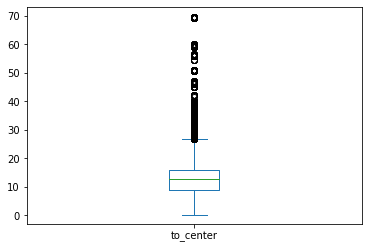

In [97]:
df_msk.loc[:, 'to_center'].plot(kind='box')


To further narrow down the sample objects that are too far away from the city center will be excluded (it will also exclude ouliers)

In [98]:
df_msk = df_msk[df_msk['to_center'] <= 25]

<AxesSubplot:>

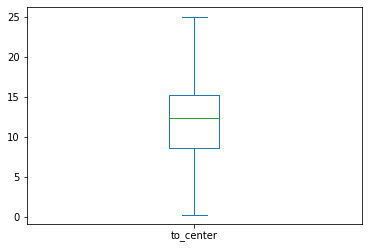

In [99]:
df_msk.loc[:, 'to_center'].plot(kind='box')

Deleting outliers, making data imputation where needed, converting values

In [100]:
#There are only 4 objects that are considered emergency houses
df_msk["is_alarm"].value_counts()
df_msk = df_msk[df_msk["is_alarm"] != "Да"]

In [101]:
#Exclusion of wooden houses as they are irrelevant
df_msk['building_type'].value_counts()
df_msk = df_msk[df_msk['building_type'] != 5]

In [102]:
#Make imputations where data is missing info with mode (the most frequently occuring value)
df_msk['heating_type'].value_counts()
df_msk["heating_type"] = df_msk["heating_type"].replace('Не заполнено', 'Центральное')

In [103]:
df_msk['hot_water_type'].value_counts()
df_msk['hot_water_type'] = df_msk['hot_water_type'].replace("Не заполнено", "Центральное")
df_msk['hot_water_type'] = df_msk['hot_water_type'].replace("Отсутствует", "Центральное")

In [104]:
df_msk['gas_type'].value_counts()
df_msk['gas_type'] = df_msk['gas_type'].replace("Не заполнено", "Отсутствует")

In [105]:
df_msk['ventilation_type'].value_counts()
df_msk['ventilation_type'] = df_msk['ventilation_type'].replace("Не заполнено", "Приточно-вытяжная вентиляция")

In [106]:
# Convert values from coded to meaningful
df_msk["building_type"] = df_msk["building_type"].replace(0, 'Другое')
df_msk["building_type"] = df_msk["building_type"].replace(1, 'Панельный')
df_msk["building_type"] = df_msk["building_type"].replace(2, 'Монолитный')
df_msk["building_type"] = df_msk["building_type"].replace(3, 'Кирпичный')
df_msk["building_type"] = df_msk["building_type"].replace(4, 'Блочный')

In [107]:
# There are two values that are alike
df_msk["floor_count_max"].describe()

count    182655.000000
mean         13.936750
std         187.834007
min           0.000000
25%           9.000000
50%          12.000000
75%          17.000000
max       32767.000000
Name: floor_count_max, dtype: float64

In [108]:
#This looks more reasonable
df_msk["levels"].describe()

count    182655.000000
mean         12.820437
std           6.061233
min           1.000000
25%           9.000000
50%          12.000000
75%          17.000000
max          39.000000
Name: levels, dtype: float64

<AxesSubplot:>

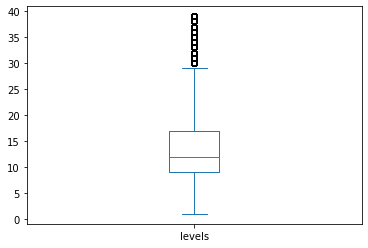

In [109]:
df_msk.loc[:, 'levels'].plot(kind='box')

In [110]:
# Getting rid of the outliers
df_msk = df_msk[df_msk["levels"] <= 26]

<AxesSubplot:>

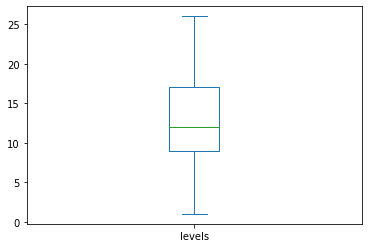

In [111]:
df_msk.loc[:, 'levels'].plot(kind='box')

In [112]:
# Studio apartments are coded as -1 which would be confusing for the model, it should be coded less than 1 (because they are usually smaller than 1 room apartment)
# Code -2 cannot be identified, it is better to get rid of observation as they might be incorrect at all
df_msk['rooms'] = df_msk['rooms'].replace(-1, 0.5)
df_msk = df_msk[df_msk['rooms'] != -2]

In [113]:
#Cleaning out all the redundant features. They are useless either because they are highly skewed or insignificant.  
# "object_type" - is incorrectly filled. Needs to be deleted.

no_use = ['Unnamed: 0', 'sewerage_type', 'time', 'region', "exploitation_start_year", 'is_alarm', 'floor_count_max','floor_type', 
            "object_type", "wall_material",
            "foundation_type", "cold_water_type","firefighting_type","drainage_type","chute_type", "electrical_type"] 
df_msk.drop(no_use, axis=1, inplace=True)

Let's have a look at other numeric values and date

In [114]:
# Converting date to datetime 
from datetime import datetime
def date_norm(date): 
    d = datetime.strptime(date, "%Y-%m-%d")
    return d

df_msk["date"] = df_msk["date"].apply(date_norm)

In [115]:
#To further use dates for regression and clustering they must be converted to numeric format. I decided to use ordinal format
df_msk['date']=df_msk['date'].map(datetime.toordinal)

In [116]:
#Just a bit fixing the type
df_msk['built_year'] = df_msk['built_year'].convert_dtypes()
df_msk.head(2)

,price,date,geo_lat,geo_lon,building_type,level,levels,rooms,area,kitchen_area,built_year,heating_type,hot_water_type,gas_type,ventilation_type,position,to_center
0,8000000,736770,55.738876,37.82537,Панельный,5,9,2.0,45.0,6.0,1971,Центральное,Открытая с отбором сетевой воды на горячее вод...,Центральное,Приточно-вытяжная вентиляция,"55.738876,37.82537",13.145503
1,11500000,736787,55.798921,37.73809,Панельный,14,16,3.0,64.9,8.0,1973,Центральное,Закрытая с приготовлением горячей воды на ЦТП,Отсутствует,Вытяжная вентиляция,"55.7989215,37.7380901",8.927614


A lot of outliers in many variables. They need to be cleaned out.

<AxesSubplot:>

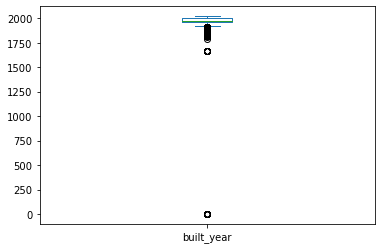

In [117]:
df_msk.loc[:, 'built_year'].plot(kind='box')

In [118]:
df_msk = df_msk[df_msk["built_year"] >= 1920]

<AxesSubplot:>

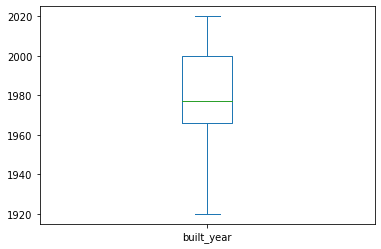

In [119]:
df_msk.loc[:, 'built_year'].plot(kind='box')

<AxesSubplot:>

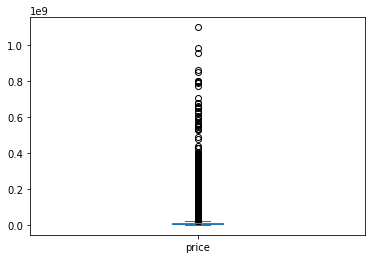

In [120]:
df_msk.loc[:, 'price'].plot(kind='box')

In [121]:
df_msk = df_msk[df_msk["price"] < 19000000]
df_msk = df_msk[df_msk['price'] > 2000000]

<AxesSubplot:>

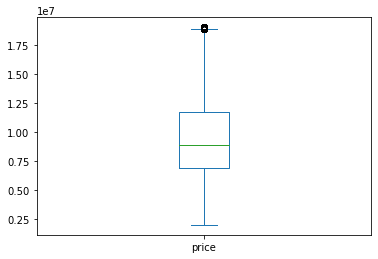

In [122]:
df_msk.loc[:, 'price'].plot(kind='box')

<AxesSubplot:>

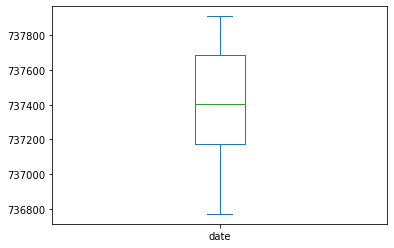

In [123]:
df_msk.loc[:, 'date'].plot(kind='box')

<AxesSubplot:>

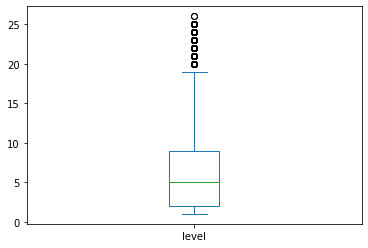

In [124]:
df_msk.loc[:, 'level'].plot(kind='box')

In [125]:
df_msk = df_msk[df_msk["level"] < 20]

<AxesSubplot:>

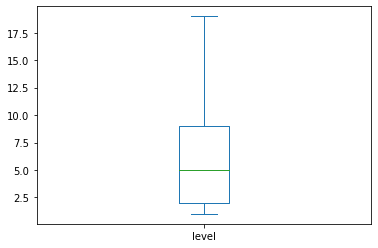

In [126]:
df_msk.loc[:, 'level'].plot(kind='box')

<AxesSubplot:>

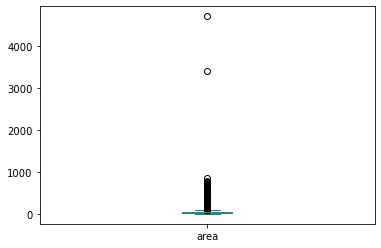

In [127]:
df_msk.loc[:, 'area'].plot(kind='box')

In [128]:
df_msk = df_msk[df_msk['area'] > 10]

In [129]:
df_msk = df_msk[df_msk['area'] < 90]

<AxesSubplot:>

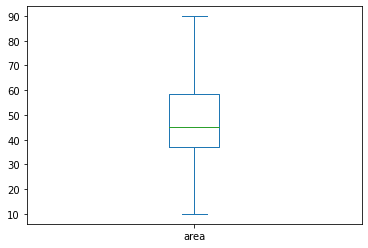

In [130]:
df_msk.loc[:, 'area'].plot(kind='box')

<AxesSubplot:>

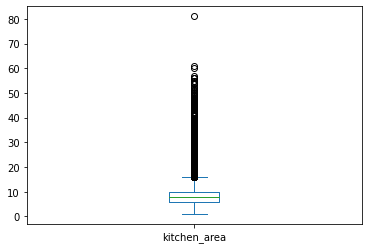

In [131]:
df_msk.loc[:, 'kitchen_area'].plot(kind='box')

In [132]:
df_msk = df_msk[df_msk['kitchen_area'] < 15.5]

<AxesSubplot:>

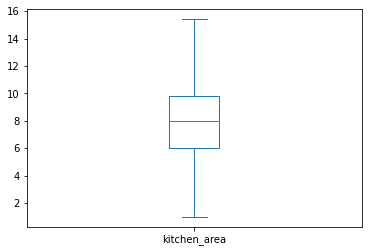

In [133]:
df_msk.loc[:, 'kitchen_area'].plot(kind='box')

### Final dataset now contains only houses with the following values: 
*   to_center <= 25
*   levels <= 26
*   built_year => 1920
*   2.000.000 < price < 19.000.000
*   level < 20
*   10 < area < 90
*   kitchen_area < 15,5

Now it is time to convert non-numeric values (categorical variables) to dummy variables

In [134]:
print('heating_type:', df_msk['heating_type'].unique())
print('gas_type:', df_msk['gas_type'].unique())
print('building_type:', df_msk['building_type'].unique())
print('hot_water_type:', df_msk['hot_water_type'].unique())
print('ventilatuon_type:', df_msk['ventilation_type'].unique())

heating_type: ['Центральное' 'Автономная котельная (крышная, встроенно-пристроенная)'
 'Индивидуальный тепловой пункт (ИТП)' 'Печное'
 'Квартирное отопление (квартирный котел)' 'Отсутствует']
gas_type: ['Центральное' 'Отсутствует' 'Автономное']
building_type: ['Панельный' 'Монолитный' 'Кирпичный' 'Блочный' 'Другое']
hot_water_type: ['Открытая с отбором сетевой воды на горячее водоснабжение из тепловой сети'
 'Закрытая с приготовлением горячей воды на ЦТП' 'Центральное'
 'Автономная котельная (крышная, встроенно-пристроенная)'
 'Закрытая с приготовлением горячей воды на ИТП'
 'Квартирное (квартирный котел)' 'Печное']
ventilatuon_type: ['Приточно-вытяжная вентиляция' 'Вытяжная вентиляция'
 'Приточная вентиляция' 'Отсутствует']


In a cell below fictious varibales (dummy) are created. Because regressiom modeling specifics first values are dropped.

In [135]:
df_msk = pd.concat([df_msk, pd.get_dummies(df_msk['hot_water_type'], prefix='hot_water_type', drop_first=True)],axis=1)
df_msk = pd.concat([df_msk, pd.get_dummies(df_msk['ventilation_type'], prefix='ventilation_type', drop_first=True)],axis=1)
df_msk = pd.concat([df_msk, pd.get_dummies(df_msk['heating_type'], prefix='heating_type', drop_first=True)],axis=1)
df_msk = pd.concat([df_msk, pd.get_dummies(df_msk['gas_type'], prefix='gas_type', drop_first=True)],axis=1)
df_msk = pd.concat([df_msk, pd.get_dummies(df_msk['building_type'], prefix='building_type', drop_first= True)],axis=1)
df_msk.drop(['hot_water_type', 'ventilation_type', "heating_type", "gas_type", "building_type"], axis=1, inplace=True)

Control group now includes (first dropped values): 
* hot_water_type - 'Автономная котельная (крышная, встроенно-пристроенная)'
* ventilation_type - 'Вытяжная вентилляция' 
* heating_type - 'Автономная котельная (крышная, встроенно-пристроенная 
*   gas_type - 'Автономное'
*   building_type - 'Блочный' 

Let's observe dispersion and correlation matrix

In [136]:
n = df_msk.drop(df_msk[["geo_lat", "geo_lon", "position"]], axis=1).iloc[:,:9]

C:\Users\user\anaconda3\lib\site-packages\seaborn\distributions.py:453: FutureWarning: In a future version, the Index constructor will not infer numeric dtypes when passed object-dtype sequences (matching Series behavior)
  pd.Index(edges[:-1], name="edges"),
C:\Users\user\anaconda3\lib\site-packages\seaborn\distributions.py:454: FutureWarning: In a future version, the Index constructor will not infer numeric dtypes when passed object-dtype sequences (matching Series behavior)
  pd.Index(np.diff(edges) * shrink, name="widths"),


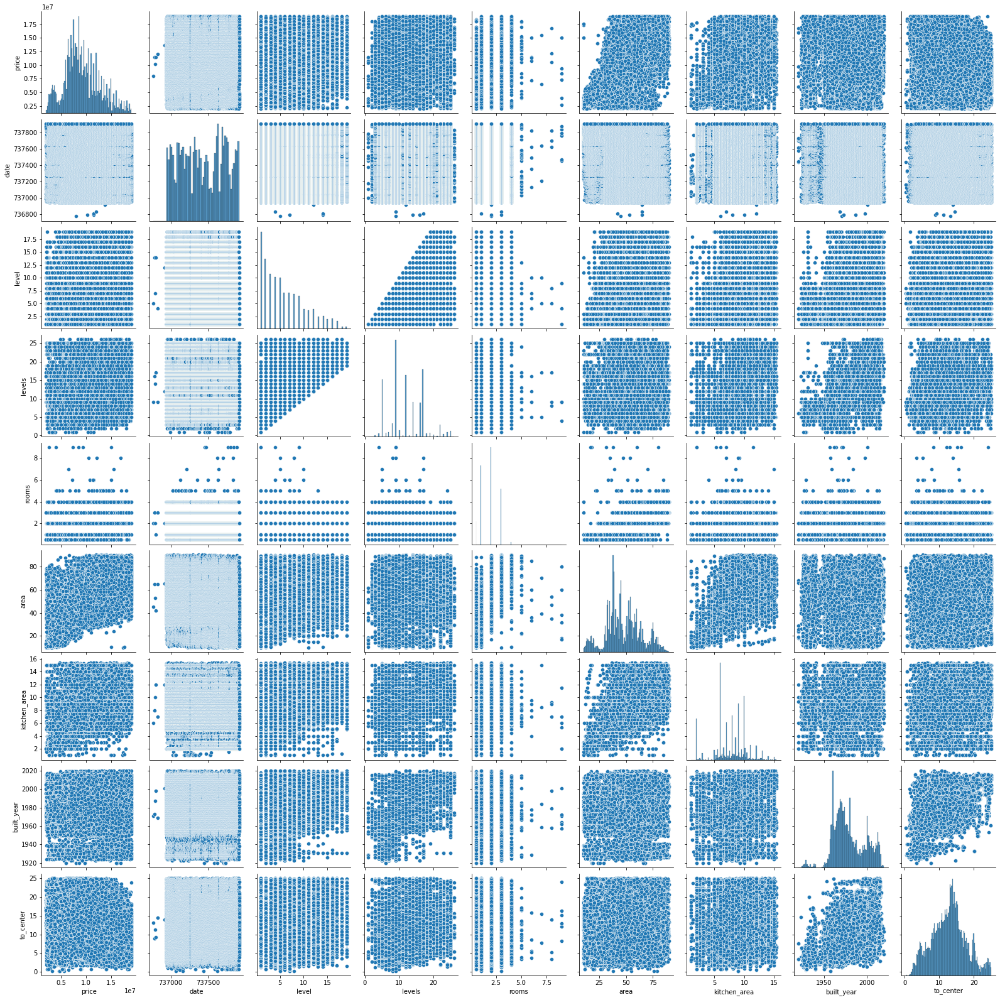

In [137]:
sns.pairplot(n, palette="rocket")

<AxesSubplot:>

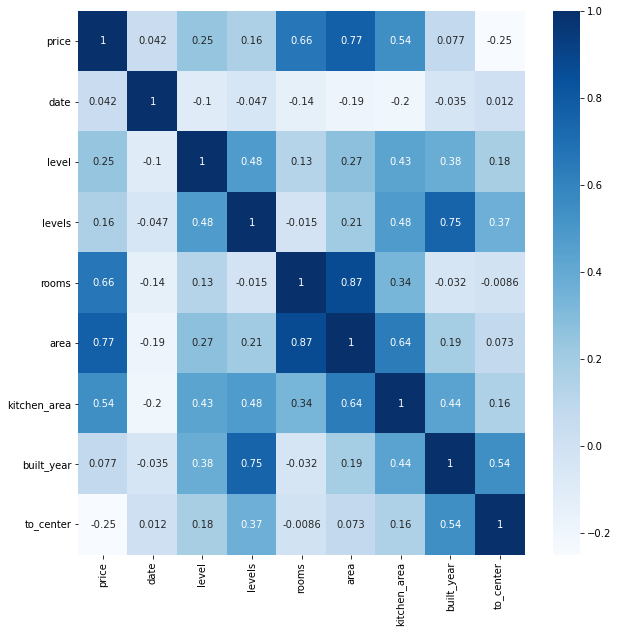

In [138]:
plt.figure(figsize=(10, 10))
sns.heatmap(n.corr(), annot=True,cmap="Blues")

Looks like reasonable correlation coefficients. Date of publication (date) and built year are have small corr coefs with price, but for practical reasons they will be kept in dataset

# **Step 3. Regression Modelling**

In [139]:
# Predictor variable to X
df = df_msk.iloc[:, 1:]
df.drop(df[['position', 'geo_lon', 'geo_lat']], axis =1, inplace = True)
df.head(2)

,date,level,levels,rooms,area,kitchen_area,built_year,to_center,hot_water_type_Закрытая с приготовлением горячей воды на ИТП,hot_water_type_Закрытая с приготовлением горячей воды на ЦТП,...,heating_type_Квартирное отопление (квартирный котел),heating_type_Отсутствует,heating_type_Печное,heating_type_Центральное,gas_type_Отсутствует,gas_type_Центральное,building_type_Другое,building_type_Кирпичный,building_type_Монолитный,building_type_Панельный
0,736770,5,9,2.0,45.0,6.0,1971,13.145503,0,0,...,0,0,0,1,0,1,0,0,0,1
1,736787,14,16,3.0,64.9,8.0,1973,8.927614,0,1,...,0,0,0,1,1,0,0,0,0,1


In [140]:
#For testing results 
models = pd.DataFrame(index=['train_mse','test_mse','train_r2','test_r2'], 
                          columns=['MLR', 'LASSO'])

First splitting the data, scaling it and taking logarithm of price (target variable) to normalize the data distribution 

In [141]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import RobustScaler
from sklearn.metrics import r2_score
import math
robust_scaler = RobustScaler()

X = df.values
X = robust_scaler.fit_transform(X)


y = df_msk['price'].apply(lambda x:math.log(x))

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=123, shuffle=True)

First model: Simple multiple linear regression 

In [142]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

linear_regression = LinearRegression()
linear_regression.fit(X_train, y_train)

models.loc['train_mse','MLR'] = mean_squared_error(y_pred=linear_regression.predict(X_train), 
                                                    y_true=y_train)

models.loc['test_mse','MLR'] = mean_squared_error(y_pred=linear_regression.predict(X_test), 
                                                   y_true=y_test)

models.loc['train_r2', 'MLR'] = r2_score(y_pred=linear_regression.predict(X_train), 
                                                    y_true=y_train)

models.loc['test_r2', 'MLR'] = r2_score(y_pred=linear_regression.predict(X_test), 
                                                    y_true=y_test)

Second model: Multiple linear regression with regularization (penalties for overfitting, potentially can increase accuracy) 

In [143]:
from sklearn.linear_model import Lasso

lasso = Lasso(alpha=0.0005)
lasso.fit(X_train, y_train)

models.loc['train_mse','LASSO'] = mean_squared_error(y_pred=lasso.predict(X_train), 
                                                    y_true=y_train)

models.loc['test_mse','LASSO'] = mean_squared_error(y_pred=lasso.predict(X_test), 
                                                   y_true=y_test)

models.loc['train_r2', 'LASSO'] = r2_score(y_pred=lasso.predict(X_train), 
                                                    y_true=y_train)

models.loc['test_r2', 'LASSO'] = r2_score(y_pred=lasso.predict(X_test), 
                                                    y_true=y_test)

In [144]:
models

,MLR,LASSO
train_mse,0.042041,0.042151
test_mse,0.041212,0.041328
train_r2,0.763065,0.762445
test_r2,0.766405,0.765746


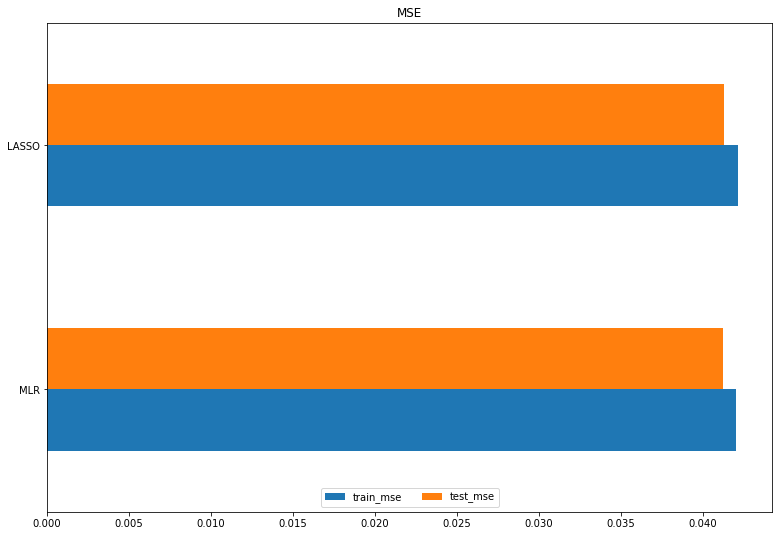

In [145]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(13,9))
models.iloc[[0, 1]].T.plot(kind='barh', ax=ax)
ax.set_title('MSE')
ax.legend(loc=8, ncol=5);

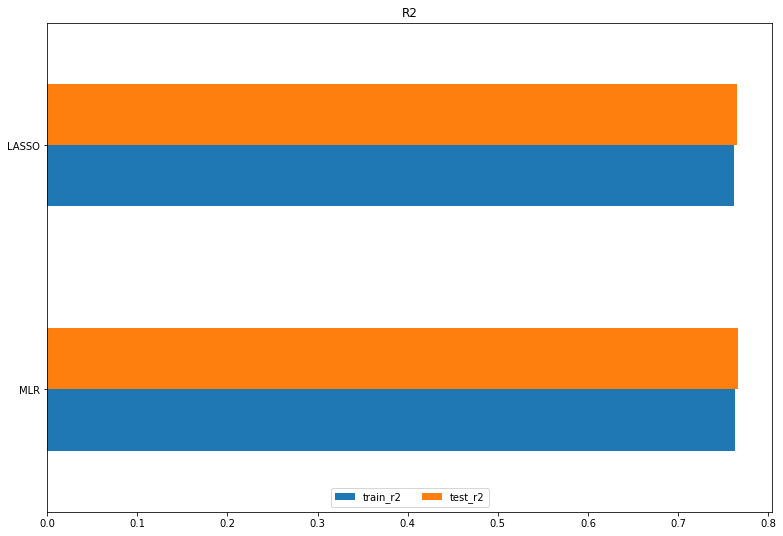

In [146]:
fig, ax = plt.subplots(figsize=(13,9))
models.iloc[[2, 3]].T.plot(kind='barh', ax=ax)
ax.set_title('R2')
ax.legend(loc=8, ncol=5);

Models show pretty much the same results. We could use more advanced techniques but looks like we are not getting results that will be much better. Usual MLR performs slightly better, let's proceed with it.

<h3>Below there is a test of prediction model that is applied to randomly generated house features<br>
Anyone intersted can write down the values into new_house and get a prediction<br>
Reminder of which categories made up the control group:


*   hot_water_type - 'Автономная котельная (крышная, встроенно-пристроенная)'
* ventilation_type - 'Вытяжная вентилляция' 
* heating_type - 'Автономная котельная (крышная, встроенно-пристроенная 
*   gas_type - 'Автономное'
*   building_type - 'Блочный' 

In [147]:
from collections import OrderedDict

new_house = OrderedDict([#общие
                         ('date', 736770), ('level', 1), ('levels', 9), ('rooms', 2.0 ), ('area', 47.0), ('kitchen_area', 6.0), ('built_year', 1971), ('to_center', 13.14), 
                         #вода
                         ('hot_water_type_Закрытая с приготовлением горячей воды на ИТП', 0), ('hot_water_type_Закрытая с приготовлением горячей воды на ЦТП', 0), ('hot_water_type_Квартирное (квартирный котел)',0), ('hot_water_type_Открытая с отбором сетевой воды на горячее водоснабжение из тепловой сети', 1), ('hot_water_type_Печное', 0), ('hot_water_type_Центральное',0),
                         # вентиляция
                         ('ventilation_type_Отсутствует',0), ('ventilation_type_Приточная вентиляция',0), ('ventilation_type_Приточно-вытяжная вентиляция', 1), 
                         # отопление
                         ('heating_type_Индивидуальный тепловой пункт (ИТП)', 0), ('heating_type_Квартирное отопление (квартирный котел)',0), ('heating_type_Отсутствует',0), ('heating_type_Печное',0), ('heating_type_Центральное', 1), 
                         # газ
                         ('gas_type_Отсутствует',0), ('gas_type_Центральное',1),
                         # здание
                         ('building_type_Панельный',1), ('building_type_Кирпичный',0), ('building_type_Монолитный',0), ('building_type_Другое',0)])

new_house = pd.Series(new_house).values.reshape(1,-1)

Data need to be transformed using previously fitted scaler and result should be exponentiated (because model was trained on logarithm of price)

In [148]:
new_house = robust_scaler.transform(new_house)
m = linear_regression.predict(new_house)
print("The price of the given house will approximately: {} rubles".format(int(np.around(np.exp(m)))))

The price of the given house will approximately: 6908754 rubles


<h3>Part 2: Clustering 

In [149]:
!pip install kneed
from sklearn.preprocessing import StandardScaler, RobustScaler
from sklearn.cluster import KMeans

In [150]:
#Dropping redundant variables
df_clust = df_msk.drop(df_msk[["position", "date", 'geo_lon', 'geo_lat']], axis=1)

In [151]:
scaler = StandardScaler()
X_ = scaler.fit_transform(df_clust)

Let's quantitatively estimate the number of clusters that is sufficient for K-Means clustering. For this purpose  K-Means inertia and "elbow" method is used.

In [152]:
sse = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=123)
    kmeans.fit(X_)
    sse.append(kmeans.inertia_)

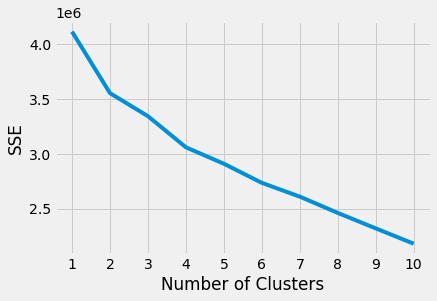

In [153]:
plt.style.use("fivethirtyeight")
plt.plot(range(1, 11), sse)
plt.xticks(range(1, 11))
plt.xlabel("Number of Clusters")
plt.ylabel("SSE")
plt.show()

In [154]:
#Kneelocator detects where the most salient elbow is located throught the obseravations 
from kneed import KneeLocator
kl = KneeLocator(
    range(1, 11), sse, curve="convex", direction="decreasing"
)

kl.elbow

4

!NB Other clustering algorithms (e.g. hierarchical, dbscan etc.) take unreasonable amount of space and time to execute for the purpose of this analysis.    

In [155]:
kmeans = KMeans(n_clusters = 4, random_state=123)
kmeans.fit(X_)

KMeans(n_clusters=4, random_state=123)

In [156]:
labels = kmeans.labels_
df_msk.loc[:, "cluster_label"] = labels 

In [157]:
df_msk['cluster_label'].value_counts()

1    62822
3    48527
0    34174
2     1483
Name: cluster_label, dtype: int64

The data distribution among clusters might look unreasonable but let's do some tests. First silhouette coefficients will be calculated. It should be calculated for any reasonbale amount of clusters but I am leaving a single analysis for the sake of time. 

In [158]:
from sklearn.metrics import silhouette_score
score = silhouette_score(X_, kmeans.labels_)
score

0.14726878817745429

In [ ]:
'''silhouette_coefficients = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters = 4, random_state=123)
    kmeans.fit(X_)
    labels = kmeans.labels_
    score = silhouette_score(X_, kmeans.labels_)
    silhouette_coefficients.append(score)
    
silhouette_coefficients'''

Anyone interested can try running silhouette for some 10-11 clusters but it takes a lot of time.

In [160]:
#Let's observe observations distribution by 2 random variables. 
#Observed overlapping is the reason for the silhouette score being low. 

import plotly.express as px
fig = px.scatter(df_msk, y="price", x="area", color="cluster_label")
fig.show()

In [161]:
# Description of classes using mean of variables
df_msk.groupby(['cluster_label']).mean()

,price,date,geo_lat,geo_lon,level,levels,rooms,area,kitchen_area,built_year,...,heating_type_Квартирное отопление (квартирный котел),heating_type_Отсутствует,heating_type_Печное,heating_type_Центральное,gas_type_Отсутствует,gas_type_Центральное,building_type_Другое,building_type_Кирпичный,building_type_Монолитный,building_type_Панельный
cluster_label,,,,,,,,,,,,,,,,,,,,,
0,9.887177e+06,737432.004389,55.762378,37.617839,3.750629,7.307280,1.825891,45.906252,6.779665,1959.940715,...,0.000351,0.004448,0.000088,0.993475,0.058700,0.936063,0.000293,0.934775,0.009393,0.003248
1,1.025468e+07,737399.583331,55.723565,37.610592,8.081023,15.942552,1.945194,54.624328,9.517861,1994.017335,...,0.000541,0.000939,0.000637,0.986422,0.960173,0.037407,0.001544,0.036357,0.124845,0.799720
2,1.028447e+07,737398.690492,55.662729,37.432254,9.026972,17.877276,1.577883,53.008301,10.867148,2012.71207,...,0.000000,0.000000,0.000000,0.000000,0.988537,0.008766,0.004046,0.055968,0.457856,0.476062
3,7.334928e+06,737459.359614,55.732933,37.642763,4.376718,10.341975,1.584324,38.703843,6.176842,1972.612546,...,0.000495,0.000227,0.000165,0.998207,0.200157,0.794547,0.000371,0.002287,0.021534,0.834237


The smallest and the most expensive cluster is "modern houses". Though they are mostly far away from the city center. This looks pretty reasonable because it has been filled with brick houses since 1960. 
Newer houses also mostly do not have gas, while having higher number of storeys, bigger total and kitchen area (comparing to clusters 1 and 3). 
We can also observe a tendency of moving towards individual heating point instead of connectin to centralized heating systems. Moreover, evolution of building material usage can be observed here too: brick houses -> panel houses -> monolith houses.  

<h3>Part 3: Visualization of clusters

Need to install a couple of additional libraries. MacOS users may need some adjustments in installation process.
To visualize objects on map ipyleaflet library will be used.

In [162]:
!pip install ipyleaflet
!pip install ipywidgets

In [163]:
#In case ipyleaflet installation did not work
#!conda install -c conda-forge ipyleaflet

In [164]:
from ipywidgets import HTML
from ipyleaflet import Map, Marker, Popup
from ipyleaflet import Map, Marker
from ipyleaflet import AwesomeIcon

In [165]:
#It is not feasible and reasonable to visualize all the objects. Thus need to take some samples out of every class.
#Observations are taken for demonstration purposes. We can take other samples or take objects randomly instead.
df_cl_0 = df_msk[df_msk["cluster_label"] == 0][:100]
df_cl_1 = df_msk[df_msk["cluster_label"] == 1][:100]
df_cl_2 = df_msk[df_msk["cluster_label"] == 2][:100]
df_cl_3 = df_msk[df_msk["cluster_label"] == 3][:100]

In [166]:
#Making different icons for each cluster
icon0 = AwesomeIcon(
    name='home',
    marker_color='orange',
    icon_color='black',
    spin=False
)
icon1 = AwesomeIcon(
    name='hotel',
    marker_color="green",
    icon_color='black',
    spin=False
)
icon2 = AwesomeIcon(
    name='building',
    marker_color='red',
    icon_color='white',
    spin=False
)
icon3 = AwesomeIcon(
    name='university',
    marker_color='black',
    icon_color='white',
    spin=False
)

In [167]:
#Drawing objects on map according to their coordinates.

for_map = Map(center=(55.7496227,37.5237999), zoom=10)


for (index, row) in df_cl_0.iterrows():
    marker = Marker(icon = icon0, location=[row.loc['geo_lat'], row.loc['geo_lon']], draggable=False)
    for_map.add_layer(marker)

for (index, row) in df_cl_1.iterrows():
    marker = Marker(icon = icon1, location=[row.loc['geo_lat'], row.loc['geo_lon']], draggable=False)
    for_map.add_layer(marker)

for (index, row) in df_cl_2.iterrows():
    marker = Marker(icon = icon2, location=[row.loc['geo_lat'], row.loc['geo_lon']], draggable=False)
    for_map.add_layer(marker)

for (index, row) in df_cl_3.iterrows():
    marker = Marker(icon = icon3, location=[row.loc['geo_lat'], row.loc['geo_lon']], draggable=False)
    for_map.add_layer(marker)

#и вуаля!  
for_map

Map(center=[55.7496227, 37.5237999], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title…

In [168]:
#We can save the map in html format
for_map.save('my_map.html', title='Moscow housing map')